In [42]:
import pandas as pd
import numpy as np 

# Assuming the file paths are 'path_to_red_wine_data.csv' and 'path_to_white_wine_data.csv'
# Please replace these with the actual file paths or names
red_wine_data = pd.read_csv('C:/Users/dande/Desktop/Spring2024/DMT/Assignment 2/wine+quality/winequality-red.csv', sep=';')
white_wine_data = pd.read_csv('C:/Users/dande/Desktop/Spring2024/DMT/Assignment 2/wine+quality/winequality-white.csv', sep=';')

# Add a 'wineType' column to each DataFrame
red_wine_data['wineType'] = 'red'
white_wine_data['wineType'] = 'white'

# Combine the datasets
combined_wine_data = pd.concat([red_wine_data, white_wine_data], ignore_index=True)

# Check the data types again
print(combined_wine_data)


      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0               7.4              0.70         0.00             1.9      0.076   
1               7.8              0.88         0.00             2.6      0.098   
2               7.8              0.76         0.04             2.3      0.092   
3              11.2              0.28         0.56             1.9      0.075   
4               7.4              0.70         0.00             1.9      0.076   
...             ...               ...          ...             ...        ...   
6492            6.2              0.21         0.29             1.6      0.039   
6493            6.6              0.32         0.36             8.0      0.047   
6494            6.5              0.24         0.19             1.2      0.041   
6495            5.5              0.29         0.30             1.1      0.022   
6496            6.0              0.21         0.38             0.8      0.020   

      free sulfur dioxide  

In [6]:
# Select only numeric columns for the operations
numeric_data = combined_wine_data.select_dtypes(include=[np.number])

# Computing summary statistics for numeric features in the dataset
summary_stats = numeric_data.describe()

# Directly calculating the range for each numeric feature
range_values = numeric_data.max() - numeric_data.min()

# Calculating the variance for each numeric feature
variance_values = numeric_data.var()

# Adding the range and variance to the summary statistics DataFrame
summary_stats.loc['range'] = range_values
summary_stats.loc['variance'] = variance_values

# Displaying the summary statistics
print(summary_stats)


          fixed acidity  volatile acidity  citric acid  residual sugar  \
count       6497.000000       6497.000000  6497.000000     6497.000000   
mean           7.215307          0.339666     0.318633        5.443235   
std            1.296434          0.164636     0.145318        4.757804   
min            3.800000          0.080000     0.000000        0.600000   
25%            6.400000          0.230000     0.250000        1.800000   
50%            7.000000          0.290000     0.310000        3.000000   
75%            7.700000          0.400000     0.390000        8.100000   
max           15.900000          1.580000     1.660000       65.800000   
range         12.100000          1.500000     1.660000       65.200000   
variance       1.680740          0.027105     0.021117       22.636696   

            chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count     6497.000000          6497.000000           6497.000000  6497.000000   
mean         0.056034  

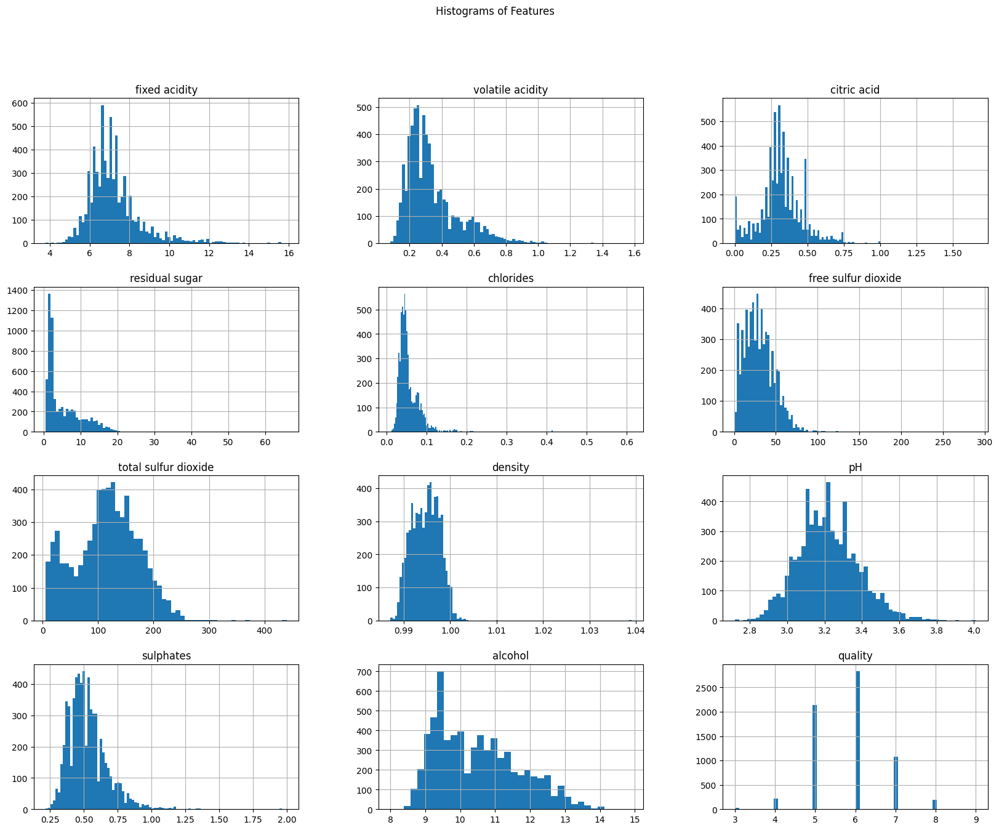

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

# 1. Histograms for each feature
def plot_histograms(data):
    data.hist(bins='auto', figsize=(20, 15))
    plt.suptitle('Histograms of Features')
    plt.show()

# Call the functions to plot the graphs
plot_histograms(combined_wine_data)

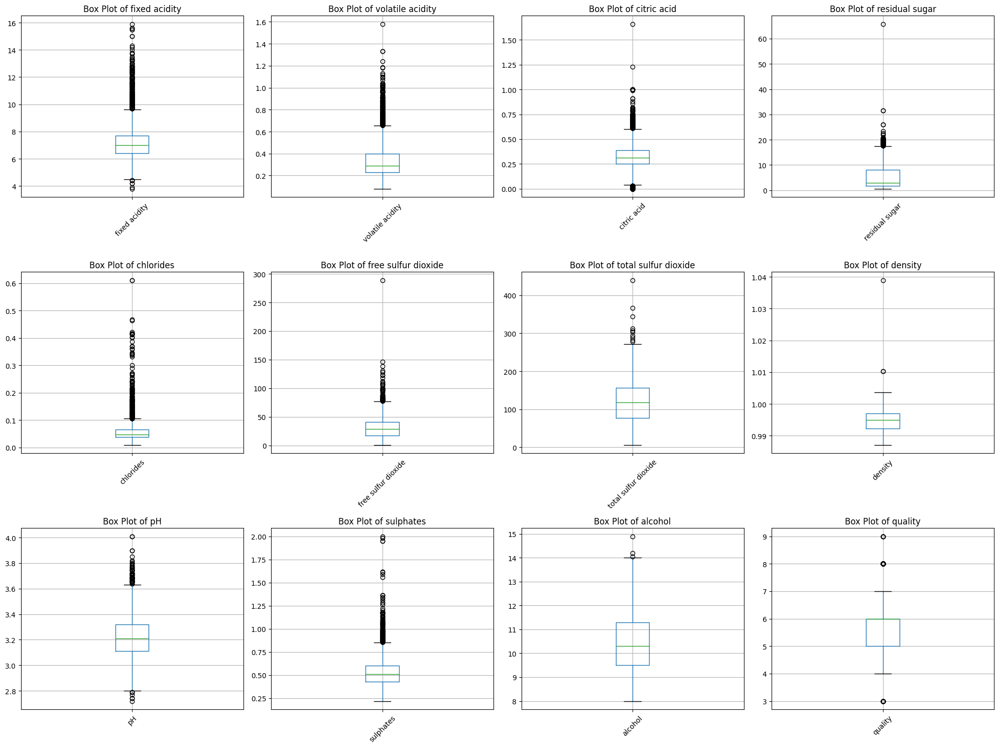

In [27]:
# 2. Box Plots for each feature
def plot_boxplots(data):
    # Filter out non-numeric columns
    numeric_data = data.select_dtypes(include=[np.number])
    
    num_features = len(numeric_data.columns)
    num_rows = num_features // 4 + (num_features % 4 > 0)
    plt.figure(figsize=(20, num_rows * 5))  # Adjust the size as needed
    
    for i, column in enumerate(numeric_data.columns, 1):
        plt.subplot(num_rows, 4, i)
        numeric_data.boxplot(column)
        plt.title(f'Box Plot of {column}')
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()
    
plot_boxplots(combined_wine_data)

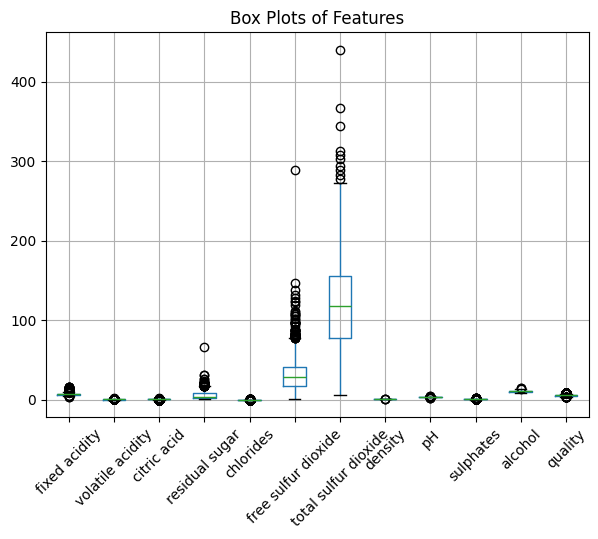

In [22]:
def plot_boxplots_combined(data):
    plt.figure(figsize=(7, 5))
    data.boxplot()
    plt.title('Box Plots of Features')
    plt.xticks(rotation=45)
    plt.show()

plot_boxplots_combined(combined_wine_data)

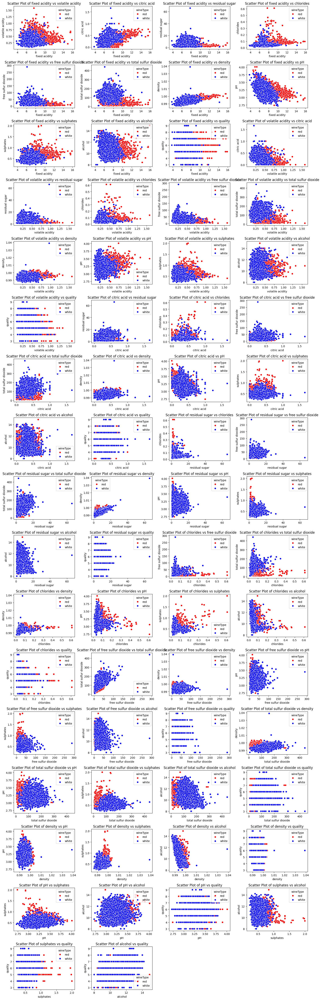

In [26]:
# 3. Pairwise Scatter Plot
def plot_pairwise_scatter(data):
    # Assuming the wine type column is named 'wine_type'
    wine_type_column = 'wineType'  

    # Check if wine_type_column exists in the dataset
    if wine_type_column not in data.columns:
        raise ValueError(f"'{wine_type_column}' column not found in the dataset")

    # Define a color palette for wine types
    palette = {'red': 'red', 'white': 'blue'}

    features = data.select_dtypes(include=[np.number]).columns
    pair_combinations = list(combinations(features, 2))
    n = len(pair_combinations)
    nrows = n // 4 + (n % 4 > 0)  # Determine the number of rows needed
    fig, axes = plt.subplots(nrows, 4, figsize=(16, nrows * 3))  # Adjust the size as needed
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

    for i, pair in enumerate(pair_combinations):
        sns.scatterplot(data=data, x=pair[0], y=pair[1], hue=wine_type_column, palette=palette, ax=axes[i])
        axes[i].set_title(f'Scatter Plot of {pair[0]} vs {pair[1]}')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

plot_pairwise_scatter(combined_wine_data)

C:\Users\dande\AppData\Local\Temp\ipykernel_12428\3668381421.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


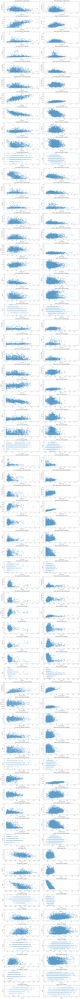

In [36]:
def plot_classwise_pairwise_scatter(data, class_column):
    # Get unique classes
    classes = data[class_column].unique()

    # Select only numeric features for the pairwise scatter plots
    features = data.select_dtypes(include=[np.number]).columns
    # Create all possible pairs of features for the scatter plots
    pair_combinations = list(combinations(features, 2))
    
    # Determine the number of rows and columns needed for the subplot grid
    n_pairs = len(pair_combinations)
    n_classes = len(classes)
    ncols = n_classes  # One column for each class
    nrows = n_pairs

    # Create the subplot grid
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, nrows*3), constrained_layout=True)

    # Iterate over each pair of features
    for i, pair in enumerate(pair_combinations):
        # For each class, create a scatter plot for the pair of features
        for j, class_value in enumerate(classes):
            class_data = data[data[class_column] == class_value]
            ax = axes[i, j] if n_pairs > 1 else axes[j]
            sns.scatterplot(data=class_data, x=pair[0], y=pair[1], ax=ax)
            ax.set_title(f'{class_value}: {pair[0]} vs {pair[1]}')

    # Adjust layout and spacing
    plt.tight_layout()
    plt.show()

# Now, to use this function, call it with your DataFrame and the column name for wine types:
plot_classwise_pairwise_scatter(combined_wine_data, 'wineType')

1. Number and Types of Features

•	Number of Features: The dataset contains 12 features.

•	Types of Features:

•	Numeric Features: Most of the features are numeric and continuous, including 'fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH', 'sulphates', and 'alcohol'.

•	Discrete Feature: 'quality' is a numeric but discrete feature as it represents quality ratings.

•	Nominal Feature: 'wineType' is a nominal feature as it categorizes the wine into red or white.


 2. Conclusions from Histograms

•	Normal Distribution: None of the features show a perfect normal distribution. However, 'alcohol' 'pH' and 'density' exhibit distributions that are somewhat closer to normal but not exactly.

•	Skewness: Several features are skewed. For instance, 'residual sugar', 'chlorides', 'free sulfur dioxide', and 'total sulfur dioxide' show a right (positive) skew. 'fixed acidity' and 'volatile acidity' also display some skewness.


 3. Insights from Box Plots

•	Outliers: Features like 'residual sugar', 'chlorides', 'free sulfur dioxide', and 'total sulfur dioxide' have many outliers, as indicated by the points outside the whiskers of the box plots.

•	Spread of Values Across Quality Ratings: Alcohol, pH, Density, free sulfur dioxide, residual sugar, citric acid, all these have same spread across different quality ratings.

•	Different Spreads Across Quality Ratings: Fixed acidity, volatile acidity, chlorides, sulphates have different spreads across different quality ratings.


 4. Observations from Pairwise Plots

•	High Correlation: Based on the pairwise plots "residual sugar, alcohol, pH, free sulphur dioxide, citric acid, density" these features are highly correlated.

•	Low or No Correlation: Features like 'sulphates, total sulphur dioxde, volatile acidity, chlorides, fixed acidity,' do not show a strong correlation with other features.


 5. Class-wise Visualization Analysis
 
•	Correlation Differences by Wine Type: 
density, pH, fixed acidity, citric acid, residual sugar, free sulphur dioxde, total sulphur dioxde, alcohol and volatile acidity are more correlated in white wine than in red wine type

In [39]:
# Adjust the file path as necessary
file_path = 'C:/Users/dande/Desktop/Spring2024/DMT/Assignment 2/forest+fires/forestfires.csv'

# Try reading the file with a comma as the separator
forest_fires_data = pd.read_csv(file_path, sep=',')

# Check the data types with the new separator
print("Data Types with Comma Separator:")
print(forest_fires_data.dtypes)

Data Types with Comma Separator:
X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH         int64
wind     float64
rain     float64
area     float64
dtype: object


In [40]:
# Select only numeric columns for the operations in the forest fires dataset
numeric_data_forest_fires = forest_fires_data.select_dtypes(include=[np.number])

# Computing summary statistics for numeric features in the dataset
summary_stats_forest_fires = numeric_data_forest_fires.describe()

# Directly calculating the range for each numeric feature
range_values_forest_fires = numeric_data_forest_fires.max() - numeric_data_forest_fires.min()

# Calculating the variance for each numeric feature
variance_values_forest_fires = numeric_data_forest_fires.var()

# Adding the range and variance to the summary statistics DataFrame
summary_stats_forest_fires.loc['range'] = range_values_forest_fires
summary_stats_forest_fires.loc['variance'] = variance_values_forest_fires

summary_stats_forest_fires


,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000
range,8.000000,7.000000,77.500000,290.200000,852.700000,56.100000,31.100000,85.000000,9.000000,6.400000,1090.840000
variance,5.353568,1.512655,30.471624,4101.951889,61536.835467,20.788832,33.716898,266.259802,3.210019,0.087592,4052.063225


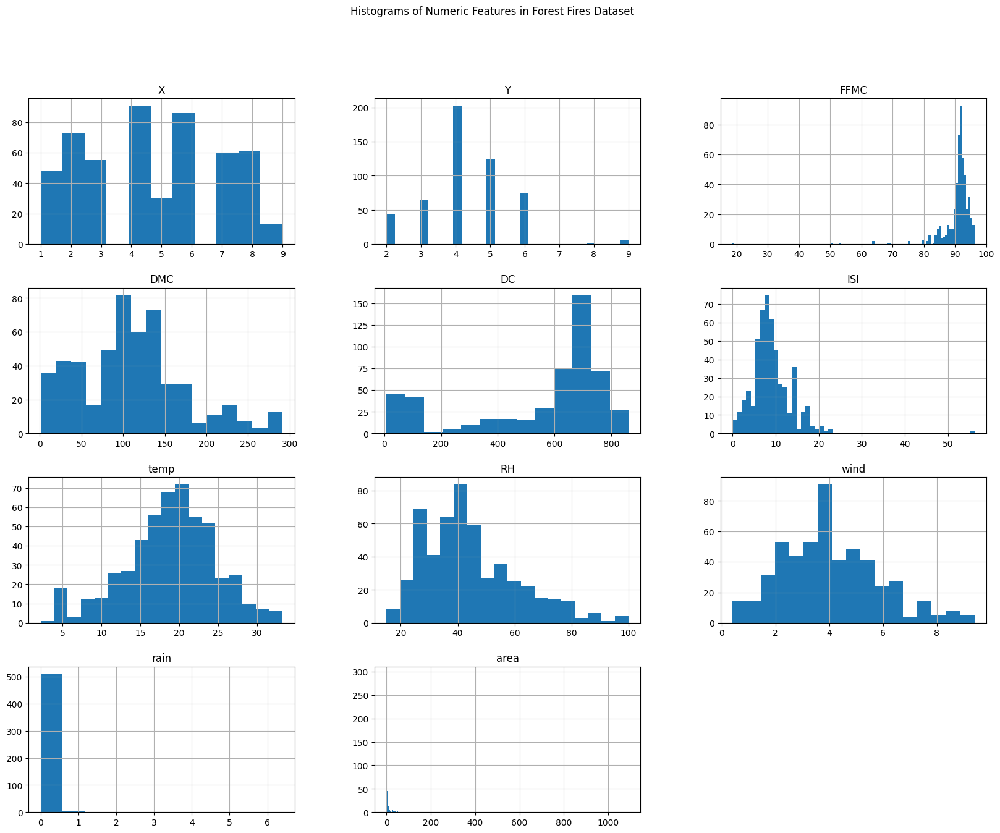

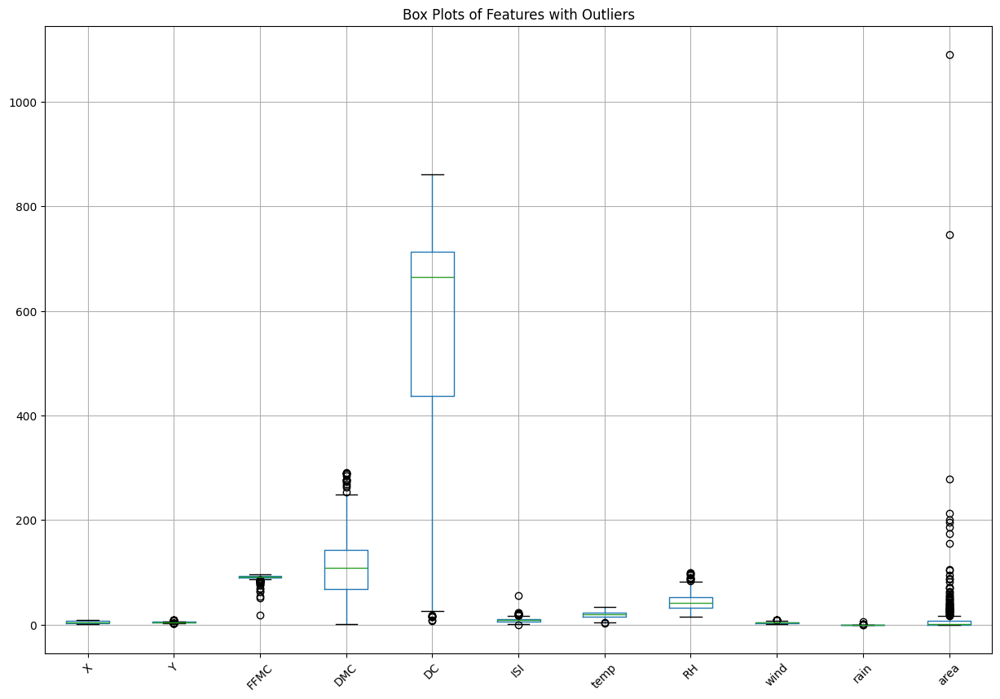

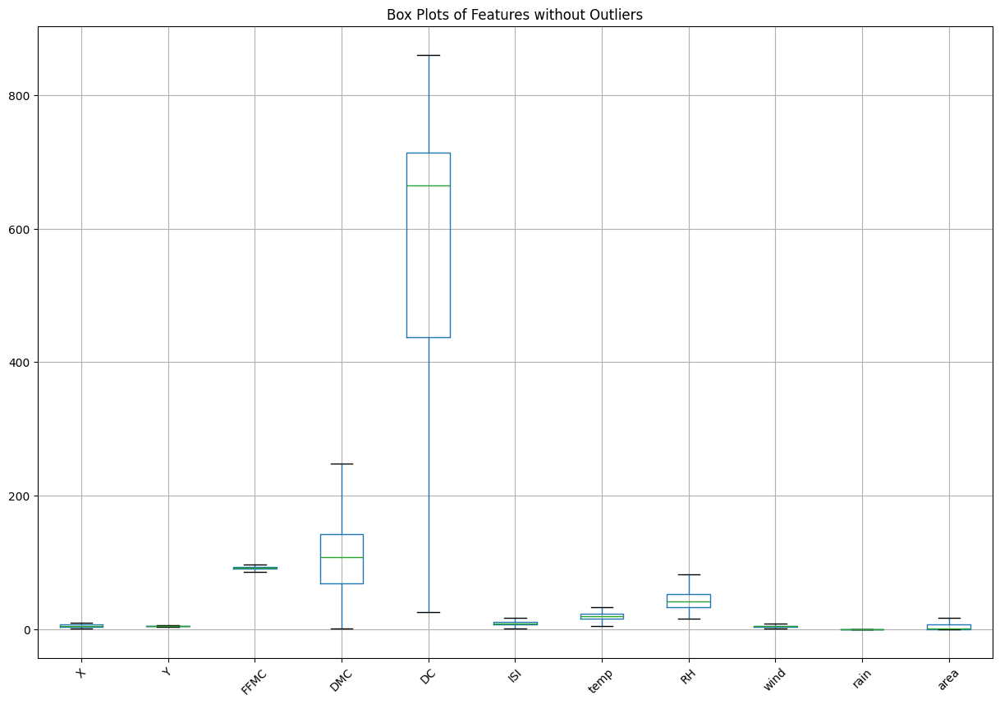

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creating histograms for each numeric feature
def plot_histograms(data):
    data.hist(bins='auto', figsize=(20, 15))
    plt.suptitle('Histograms of Numeric Features in Forest Fires Dataset')
    plt.show()

# Creating box plots with outliers
def plot_boxplots_with_outliers(data):
    plt.figure(figsize=(15, 10))
    data.boxplot()
    plt.title('Box Plots of Features with Outliers')
    plt.xticks(rotation=45)
    plt.show()

# Creating box plots without outliers
def plot_boxplots_without_outliers(data):
    plt.figure(figsize=(15, 10))
    data.boxplot(showfliers=False)
    plt.title('Box Plots of Features without Outliers')
    plt.xticks(rotation=45)
    plt.show()

# Call the functions to plot the graphs
plot_histograms(numeric_data_forest_fires)
plot_boxplots_with_outliers(numeric_data_forest_fires)
plot_boxplots_without_outliers(numeric_data_forest_fires)



1. Boxplot Analysis Without Outliers
In the boxplot without outliers, certain features may exhibit significantly different distributions compared to others. These differences can be due to the range, median, and interquartile range (IQR) of these features. For instance:

- Features like `FFMC` (Fine Fuel Moisture Code) might have a narrower spread and higher median, indicating a concentration of values in a specific range.
- `DC` (Drought Code) might show a wider spread, suggesting more variability in the data.
- Features like `rain` might have a lower median and a smaller IQR, potentially indicating that rain is a less common event.

A significantly different distribution suggests that the feature behaves differently in terms of its central tendency and variability, which could be due to the nature of the variable itself or the conditions under which the data was collected.

2. Implications of Removing Outliers
Outliers in a dataset can represent:

- Extreme but valid data points that are crucial for certain analyses, especially in understanding risk or rare events.
- Errors or anomalies in the data collection process.

Removing outliers might lead to:

- Loss of valuable information, especially if the outliers are genuine extreme values that are significant for the analysis.
- A biased dataset that does not accurately represent the real-world scenario the data is supposed to model.
- Poor performance of predictive models if they are trained on data that do not include these extreme but possible scenarios.


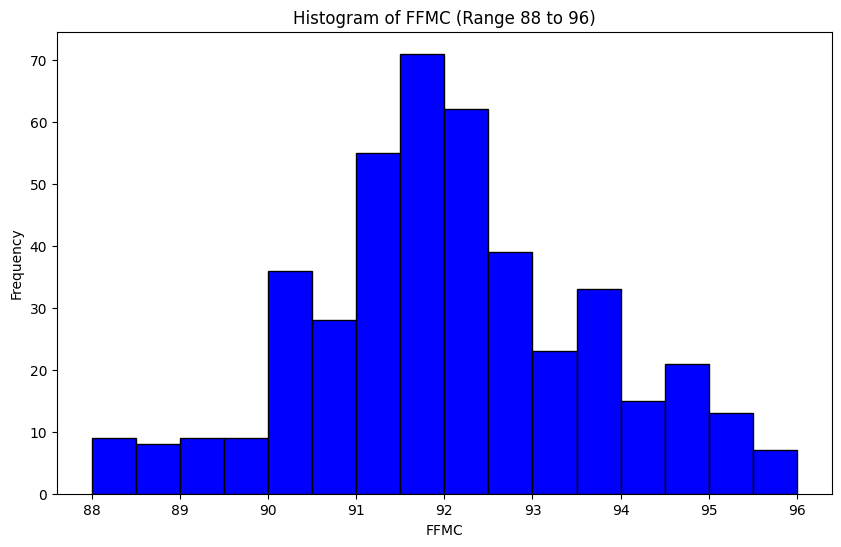

In [54]:
import matplotlib.pyplot as plt

# 3. Filter FFMC values in the range [88, 96]
ffmc_filtered = forest_fires_data[(forest_fires_data['FFMC'] >= 88) & (forest_fires_data['FFMC'] <= 96)]

# Plot histogram for FFMC in the specified range
plt.figure(figsize=(10, 6))
plt.hist(ffmc_filtered['FFMC'], bins='auto', color='blue', edgecolor='black')
plt.title('Histogram of FFMC (Range 88 to 96)')
plt.xlabel('FFMC')
plt.ylabel('Frequency')
plt.show()

4. The histogram of FFMC values between 88 and 96 looks like a slightly lopsided hill, with more data piling up towards the lower end of the range. It mostly resembles a normal distribution, but with a bit more numbers bunched up on the left side, indicating it's not perfectly even on both sides.